In [1]:
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import cmocean
import os
import warnings
warnings.filterwarnings("ignore", category=RuntimeWarning) # ignore runtime warnings; here they arise from attempted operations on all-NaN arrays

In [2]:
years = [1991, 2020]
clim_years = [1991, 2020]
basepath='/space/hall5/sitestore/eccc/crd/ccrn/users/reo000/work/MHW'

In [3]:
f_ice=basepath+f'/OISST/oisst-avhrr-v02r01.regridded1x1.monthly.{years[0]}_{years[-1]}.nc'
with xr.open_dataset(f_ice) as fice:
    icemask1=np.nanmax(fice.ice.data,axis=0)>0
    Amax=np.zeros((20,)+np.shape(icemask1))
    for ind in range(0,20):
        Amax[ind,...]=np.nanmax(fice.ice.data[12*ind:12*(ind+1),...],axis=0)
    AmaxH=np.mean(np.where(Amax>0,1,0),axis=0)
    icemask=AmaxH>0.5

In [4]:
is_detrend=True

In [5]:
years = [1991, 2020]
basepath='/space/hall5/sitestore/eccc/crd/ccrn/users/reo000/work/MHW'
# Model names
nl = dict(zip( ['CanCM4i', 'COLA-RSMAS-CCSM4', 'GEM-NEMO', 'GFDL-SPEAR', 'NASA-GEOSS2S', 'NCEP-CFSv2', 'CanESM5', 'GEM5.2-NEMO', 'GEM5-NEMO', 'CanCM4i-IC3',],
               [       11,                 11,         11,           11,              8,            9,        11,            11,          11,            11,])) # Max lead time for each model

In [6]:
def SEDIpath(mods,is_detrend,years,il):
    basepath='/space/hall5/sitestore/eccc/crd/ccrn/users/reo000/work/MHW'
    # Input/output directory
    mhwdir = basepath+'/mhw/detrended' if is_detrend else basepath+'/mhw'
    if is_detrend:
        f_save = f'{mhwdir}/SEDI_MME_{"_".join(mods)}_l{il}_detrended_{years[0]}_{years[1]}.nc'
    else:
        f_save = f'{mhwdir}/SEDI_MME_{"_".join(mods)}_l{il}_{years[0]}_{years[1]}.nc'
    return f_save

In [7]:
modict={'Jacox':['CanCM4i', 'COLA-RSMAS-CCSM4', 'GEM-NEMO', 'GFDL-SPEAR','NASA-GEOSS2S', 'NCEP-CFSv2'],
        'CanSIPSv2':['CanCM4i','GEM-NEMO'],
        'CanSIPSv21':['CanCM4i-IC3','GEM5-NEMO'],
        'CanSIPSv3':['CanESM5','GEM5.2-NEMO'],
        'GFDLNASA':[ 'GFDL-SPEAR','NASA-GEOSS2S'],}
def lblstr(modopt):
    dd={'Jacox':'Jacox NMME',
        'CanSIPSv2':'CanSIPSv2',
        'CanSIPSv21':'CanSIPSv2.1',
        'CanSIPSv3':'CanSIPSv3',
        'GFDLNASA':'GFDL-SPEAR & NASA-GEOSS2S',}
    if modopt in dd.keys():
        return dd[modopt]
    else:
        return modopt

In [8]:
ff=dict()
for modopt in ('Jacox','CanSIPSv3','CanSIPSv2','CanSIPSv21','GFDLNASA'):
    for il in (1,3,6,10):
        if modopt in modict.keys():
            mods=modict[modopt]
        elif mod in nl.keys():
            mods=[modopt,]
        else:
            raise Exception(f'nonexistent modopt value:{modopt}')
        fname=SEDIpath(mods,is_detrend,years,il)
        ff[(modopt,il)]=xr.open_dataset(fname)

In [9]:
lm=np.isnan(ff[('CanSIPSv3',1)].SEDI.values)

In [10]:
def diffplot(modoptA,modoptB): # plot B-A
    fig,axs=plt.subplots(2,2,figsize=(18,8),gridspec_kw={'hspace':.3})
    vamp=.5
    def _plt(ax,il):
        CanSEDI=ff[(modoptB,il)].SEDI
        MMESEDI=ff[(modoptA,il)].SEDI
        m1=ax.pcolormesh(np.ma.masked_where(icemask==1,CanSEDI-MMESEDI),vmin=-1*vamp,vmax=vamp,cmap=cmocean.cm.balance)
        m2=ax.contour(np.ma.masked_where(icemask==1,CanSEDI),[0,],colors='gray',linewidths=1)
        ax.set_ylim(25,155)
        ax.set_title(f' lead={il+.5} months')
        m3=ax.contour(lm,linewidths=1,colors='k')
        return m1
    ax=axs[0,0]; il=1
    m1=_plt(ax,il)
   
    ax=axs[0,1]; il=3
    m1=_plt(ax,il)
    
    ax=axs[1,0]; il=6
    m1=_plt(ax,il)
   
    ax=axs[1,1]; il=10
    m1=_plt(ax,il)
   
    ml=fig.add_axes([.3,.02,.4,.03])
    fig.colorbar(m1,cax=ml,orientation='horizontal',ticks=[-1*vamp,-.5*vamp,0,.5*vamp,vamp])
    fig.suptitle(f'SEDI({lblstr(modoptB)})-SEDI({lblstr(modoptA)})',y=.95)
    return fig,ax

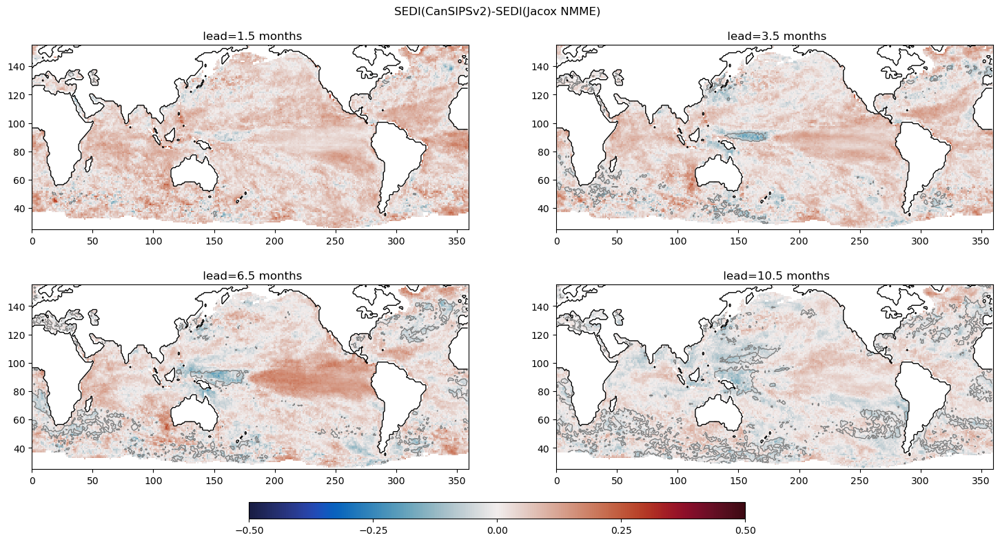

In [11]:
fig,ax=diffplot('Jacox','CanSIPSv2')

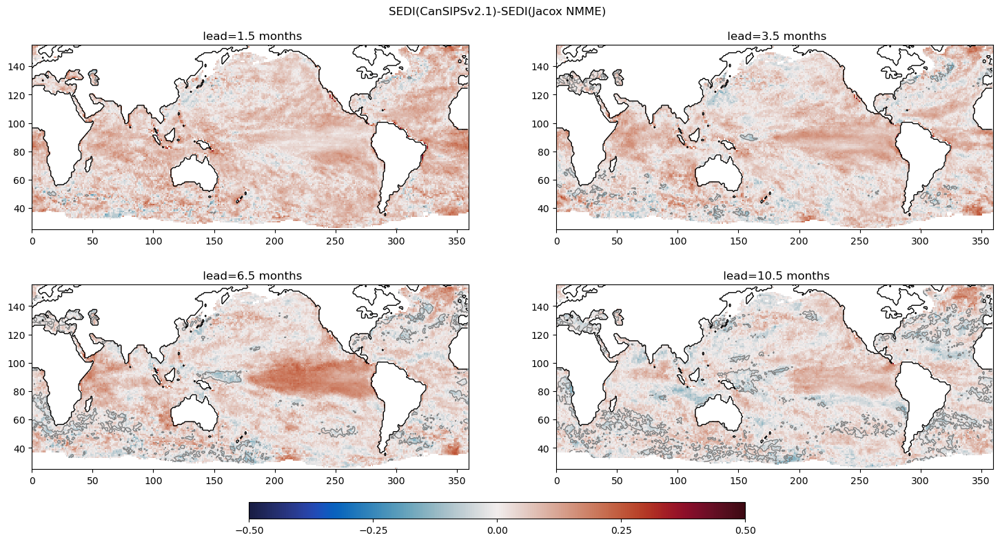

In [12]:
fig,ax=diffplot('Jacox','CanSIPSv21')

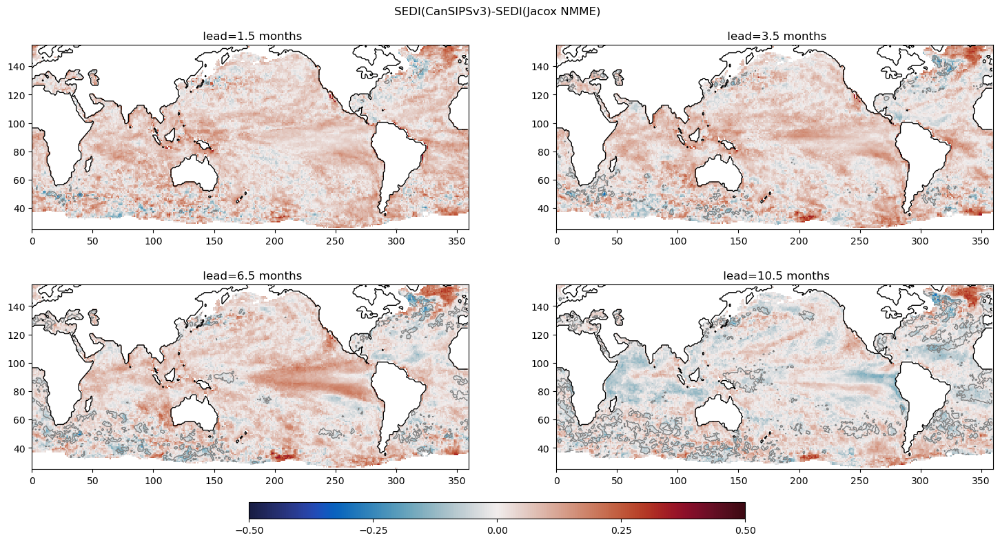

In [13]:
fig,ax=diffplot('Jacox','CanSIPSv3')

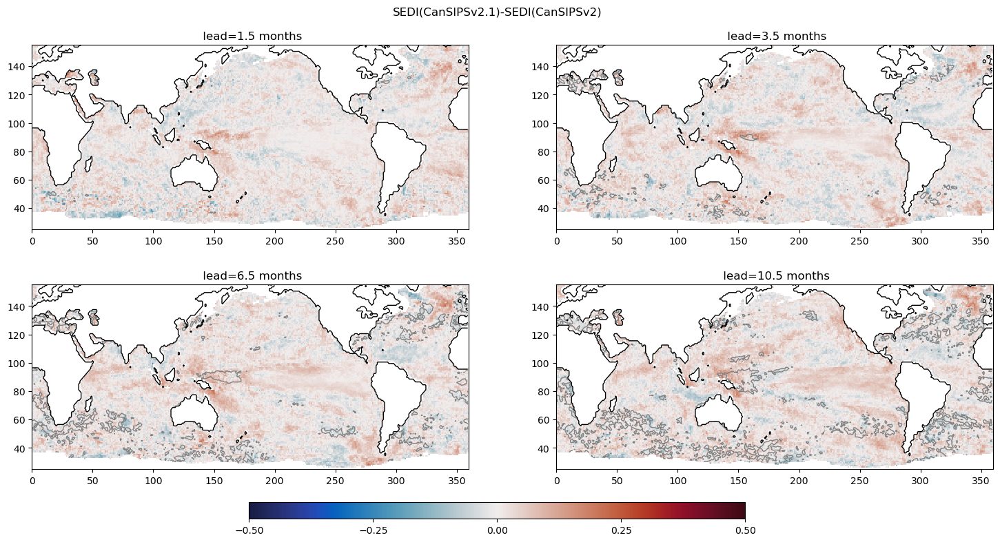

In [14]:
fig,ax=diffplot('CanSIPSv2','CanSIPSv21')

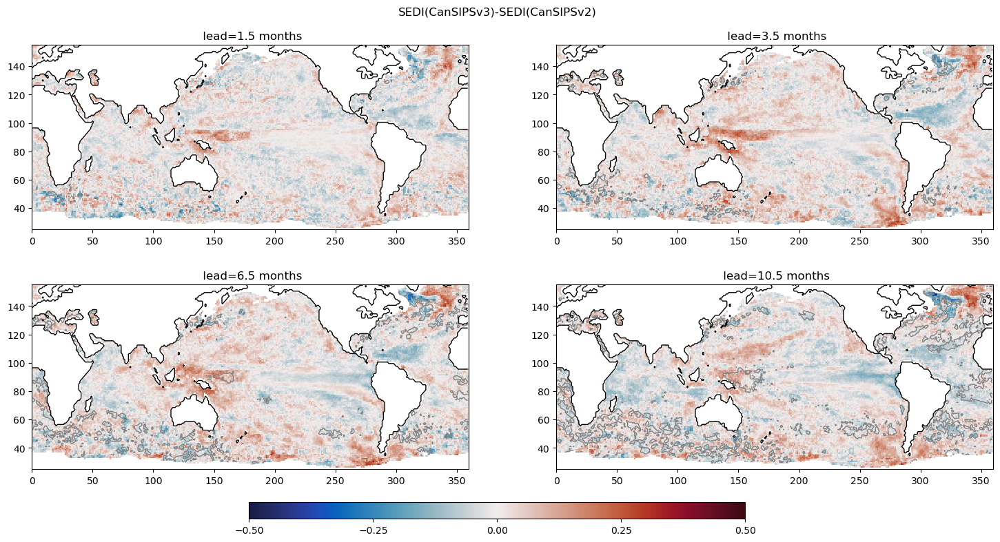

In [15]:
fig,ax=diffplot('CanSIPSv2','CanSIPSv3')

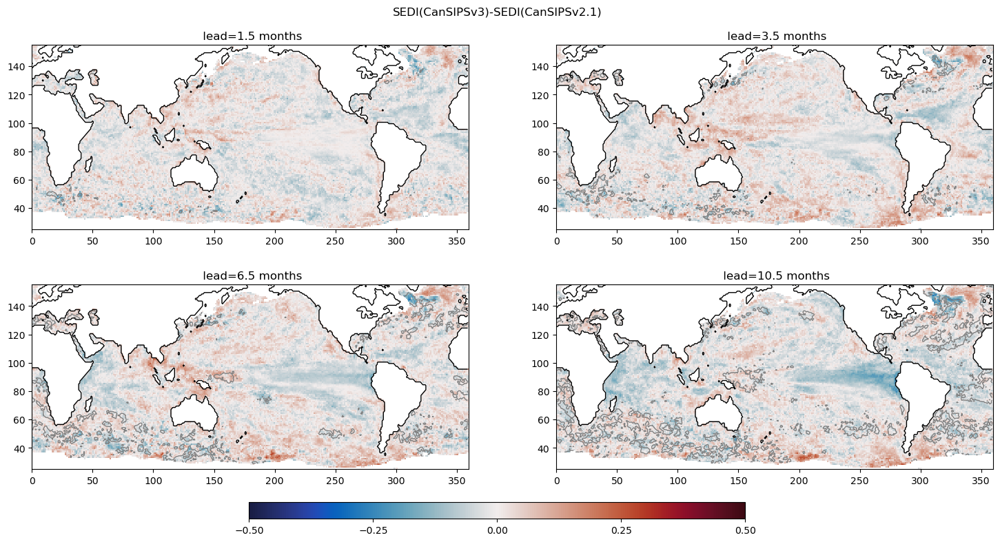

In [16]:
fig,ax=diffplot('CanSIPSv21','CanSIPSv3')

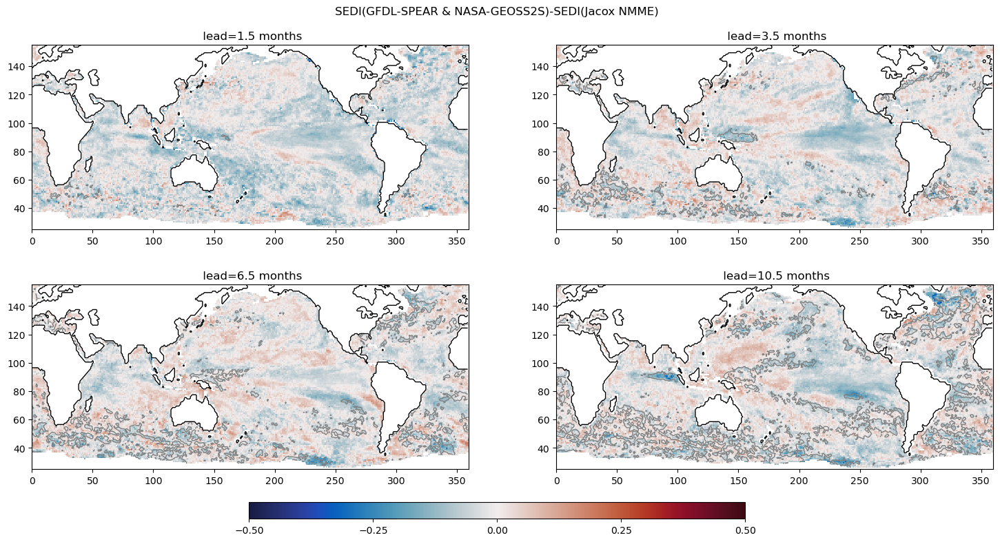

In [17]:
fig,ax=diffplot('Jacox','GFDLNASA')

In [18]:
def SEDIplot(modoptB): # plot B-A
    fig,axs=plt.subplots(2,2,figsize=(18,8),gridspec_kw={'hspace':.3})
    vamp=.5
    def _plt(ax,il):
        CanSEDI=ff[(modoptB,il)].SEDI
        m1=ax.pcolormesh(np.ma.masked_where(icemask==1,CanSEDI),vmin=-1,vmax=1,cmap=cmocean.cm.balance)
        m2=ax.contour(np.ma.masked_where(icemask==1,CanSEDI),[0,],colors='gray',linewidths=1)
        ax.set_ylim(25,155)
        ax.set_title(f' lead={il+.5} months')
        m3=ax.contour(lm,linewidths=1,colors='k')
        return m1
    ax=axs[0,0]; il=1
    m1=_plt(ax,il)
   
    ax=axs[0,1]; il=3
    m1=_plt(ax,il)
    
    ax=axs[1,0]; il=6
    m1=_plt(ax,il)
   
    ax=axs[1,1]; il=10
    m1=_plt(ax,il)
   
    ml=fig.add_axes([.3,.02,.4,.03])
    fig.colorbar(m1,cax=ml,orientation='horizontal',ticks=[-1,-.5,0,.5,1])
    fig.suptitle(f'SEDI({lblstr(modoptB)}))',y=.95)
    return fig,ax

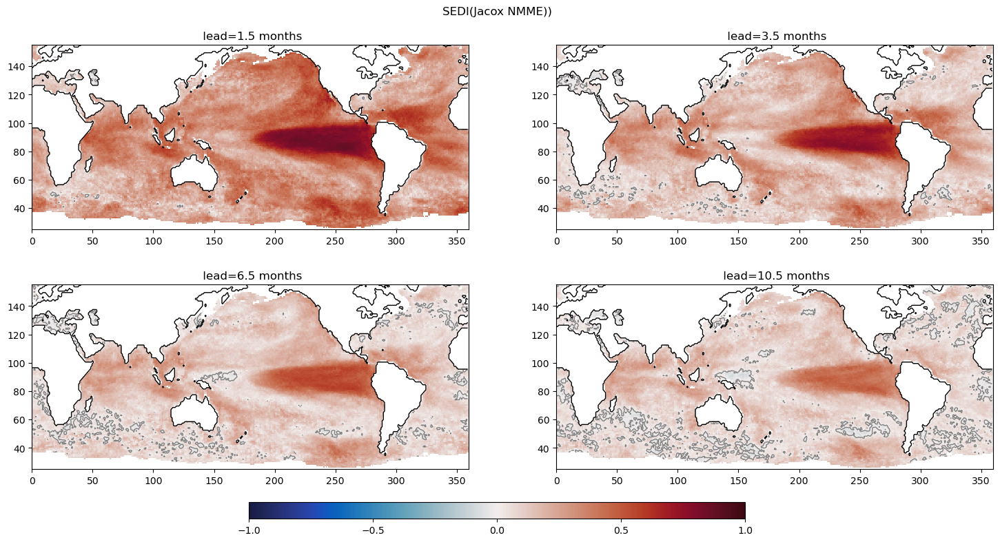

In [19]:
fig,ax=SEDIplot('Jacox')

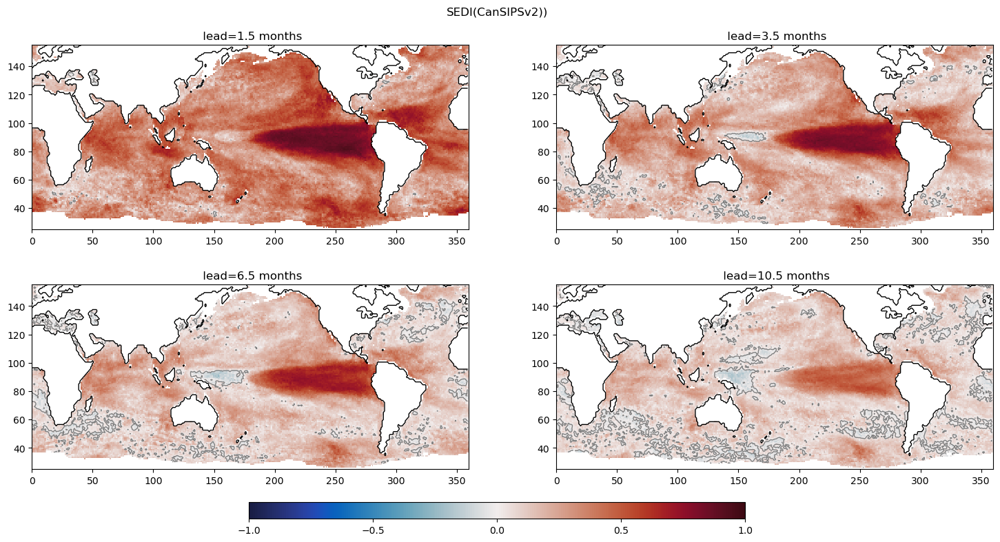

In [20]:
fig,ax=SEDIplot('CanSIPSv2')

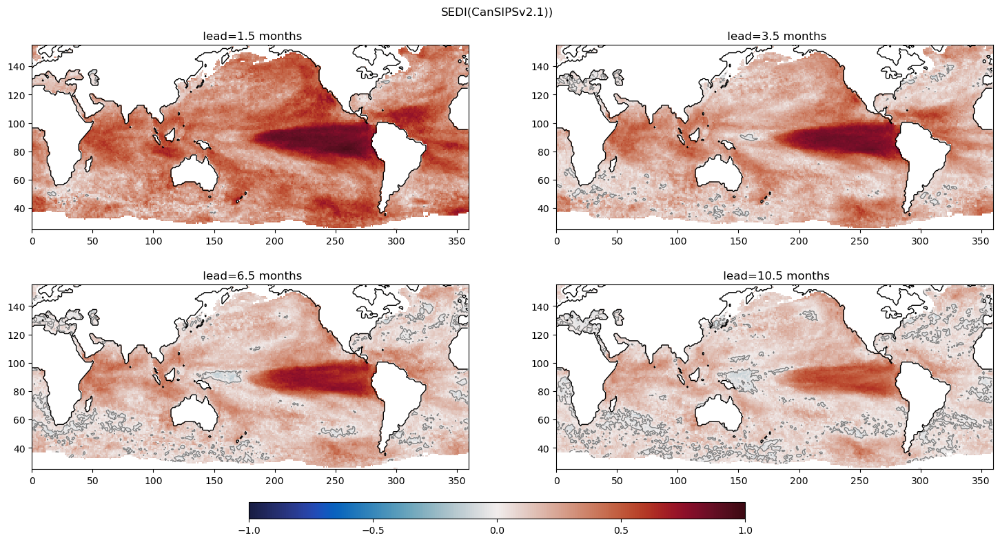

In [21]:
fig,ax=SEDIplot('CanSIPSv21')

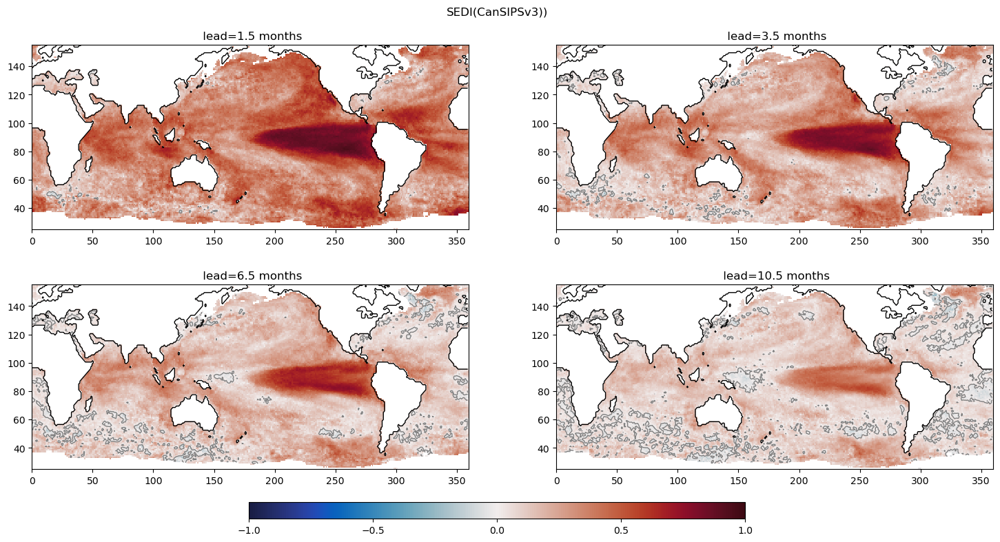

In [22]:
fig,ax=SEDIplot('CanSIPSv3')

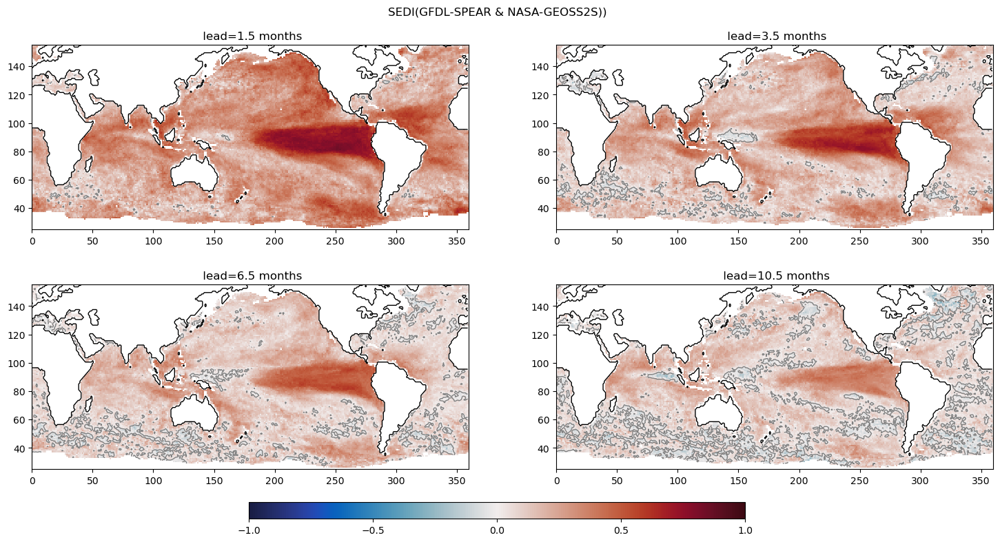

In [23]:
fig,ax=SEDIplot('GFDLNASA')